# QRT Challenge notebook
This is my notebook that contains experimentations with the datasets, using different machine learning algorithms, prioritizing unsupervised learning ones.  
In this dataset I used the following algorithms along with their best score with the challenge's metric:  
- Random forest | 0.650
- Cat boost | 0.690
- XG boost | 0.699

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm
import seaborn as sns

In [3]:
X_train = pd.read_csv('X_train.csv')
Y_train = pd.read_csv('Y_train.csv', index_col=0)
X_test = pd.read_csv('X_test.csv')

In [4]:
X_train.fillna(X_train.mean(), inplace=True)
Y_train.fillna(Y_train.mean(), inplace=True)
X_test.fillna(X_test.mean(), inplace=True)

# Fancy data visualization
Correlation matrix displayed as heatmaps and datasets previews. Adaptation of the Benchmark given by QRT for the challenge and heatmap of the 

In [114]:
Y_train

,RET_TARGET
ID,
0,-0.022351
1,-0.011892
2,-0.015285
3,-0.019226
4,0.006644
...,...
267095,0.002080
267096,-0.002565
267097,-0.018406


In [5]:
X_train.fillna(X_train.mean())
Y_train.fillna(Y_train.mean())
X_test.fillna(X_test.mean())

,ID,ID_DAY,RET_216,RET_238,RET_45,RET_295,RET_230,RET_120,RET_188,RET_260,...,RET_122,RET_194,RET_72,RET_293,RET_281,RET_193,RET_95,RET_162,RET_297,ID_TARGET
0,267100,83,0.043712,0.020260,0.027425,-0.000048,0.006963,0.000528,0.027680,0.037824,...,0.016991,0.022084,-0.006699,0.017606,0.005505,-0.000410,0.018637,0.020723,0.018418,139
1,267101,83,0.043712,0.020260,0.027425,-0.000048,0.006963,0.000528,0.027680,0.037824,...,0.016991,0.022084,-0.006699,0.017606,0.005505,-0.000410,0.018637,0.020723,0.018418,129
2,267102,83,0.043712,0.020260,0.027425,-0.000048,0.006963,0.000528,0.027680,0.037824,...,0.016991,0.022084,-0.006699,0.017606,0.005505,-0.000410,0.018637,0.020723,0.018418,136
3,267103,83,0.043712,0.020260,0.027425,-0.000048,0.006963,0.000528,0.027680,0.037824,...,0.016991,0.022084,-0.006699,0.017606,0.005505,-0.000410,0.018637,0.020723,0.018418,161
4,267104,83,0.043712,0.020260,0.027425,-0.000048,0.006963,0.000528,0.027680,0.037824,...,0.016991,0.022084,-0.006699,0.017606,0.005505,-0.000410,0.018637,0.020723,0.018418,217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114463,381563,415,-0.018322,0.034389,0.044101,-0.033431,-0.026487,-0.012058,0.041611,0.003381,...,-0.005801,-0.011807,-0.022010,-0.010799,-0.023107,-0.002279,-0.015246,-0.016463,-0.000903,241
114464,381564,415,-0.018322,0.034389,0.044101,-0.033431,-0.026487,-0.012058,0.041611,0.003381,...,-0.005801,-0.011807,-0.022010,-0.010799,-0.023107,-0.002279,-0.015246,-0.016463,-0.000903,214
114465,381565,415,-0.018322,0.034389,0.044101,-0.033431,-0.026487,-0.012058,0.041611,0.003381,...,-0.005801,-0.011807,-0.022010,-0.010799,-0.023107,-0.002279,-0.015246,-0.016463,-0.000903,102
114466,381566,415,-0.018322,0.034389,0.044101,-0.033431,-0.026487,-0.012058,0.041611,0.003381,...,-0.005801,-0.011807,-0.022010,-0.010799,-0.023107,-0.002279,-0.015246,-0.016463,-0.000903,145


In [54]:
idx_ret_features = np.where(X_train.columns.str.contains('RET'))[0]
init_ret_features = X_train.columns[idx_ret_features]
target_ret_features = 'RET_' + X_train['ID_TARGET'].astype(str)
target_ret_features = target_ret_features.unique()
returns = {}
for day in tqdm(X_train.ID_DAY.unique()):
    u = X_train.loc[X_train.ID_DAY == day]
    a = u.iloc[0, idx_ret_features]
    b = Y_train[X_train.ID_DAY == day]['RET_TARGET']
    b.index = 'RET_' + u.ID_TARGET.astype(str)
    returns[day] = pd.concat([a, b])
returns = pd.DataFrame(returns).T.astype(float)

In [55]:
returns

,RET_0,RET_1,RET_102,RET_105,RET_106,RET_108,RET_109,RET_110,RET_114,RET_115,...,RET_88,RET_9,RET_90,RET_91,RET_93,RET_95,RET_96,RET_97,RET_98,RET_99
3316,-0.016501,0.018693,0.005316,NaN,0.001352,0.027374,-0.010890,0.057911,0.014155,0.021104,...,0.027113,0.008602,0.018250,0.038581,0.027588,0.001251,0.037917,-0.002689,0.002140,0.023026
3355,0.000674,0.005759,0.007938,NaN,-0.005017,-0.007413,-0.005980,0.011900,-0.011755,0.032401,...,0.017933,0.001658,0.061274,-0.018643,0.000372,-0.010232,-0.013496,0.013819,-0.036501,0.017736
1662,-0.000919,0.010430,0.007901,NaN,0.006959,0.005593,-0.066666,0.049822,0.021599,0.019816,...,0.016645,-0.016289,0.027690,-0.026479,0.006664,0.023721,0.013057,-0.008237,0.014655,0.011614
3405,-0.004989,0.004558,0.004325,NaN,-0.007720,0.002788,-0.038432,-0.021308,0.000595,0.001613,...,-0.039065,0.021897,-0.031456,0.029652,0.016171,-0.024835,-0.020391,0.006790,0.015796,-0.015763
1602,0.002468,-0.024584,0.008947,NaN,-0.004735,-0.031061,0.012366,0.045117,-0.015403,-0.015327,...,-0.028080,0.016530,0.019826,0.014627,0.010884,-0.025205,0.006157,-0.006526,0.002125,0.036186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3332,-0.025627,-0.002788,0.008916,-0.003905,0.002002,-0.020082,-0.031841,0.013371,-0.003721,-0.020621,...,-0.031339,-0.009443,-0.018516,-0.004481,-0.028115,0.003975,-0.039744,-0.012239,0.000484,-0.000500
2314,0.004736,0.038517,0.009608,-0.011369,0.009110,-0.003109,-0.021830,0.013855,-0.000879,0.009236,...,-0.013818,0.002149,0.027094,0.008056,0.010173,-0.013254,0.011505,-0.010166,0.007159,-0.001655
1863,-0.008622,-0.024718,-0.018022,-0.049021,-0.032441,0.005332,-0.004894,-0.025226,0.008810,0.011016,...,0.017939,-0.002974,-0.014916,-0.018977,-0.009540,0.009359,-0.013263,-0.008115,0.013180,-0.007851
2868,-0.019448,-0.000201,-0.012663,-0.009721,-0.002696,-0.016217,-0.012260,-0.022070,-0.007850,0.004110,...,-0.041587,0.006387,-0.011207,-0.013654,0.026946,-0.018058,-0.014283,-0.001103,0.034876,-0.008260


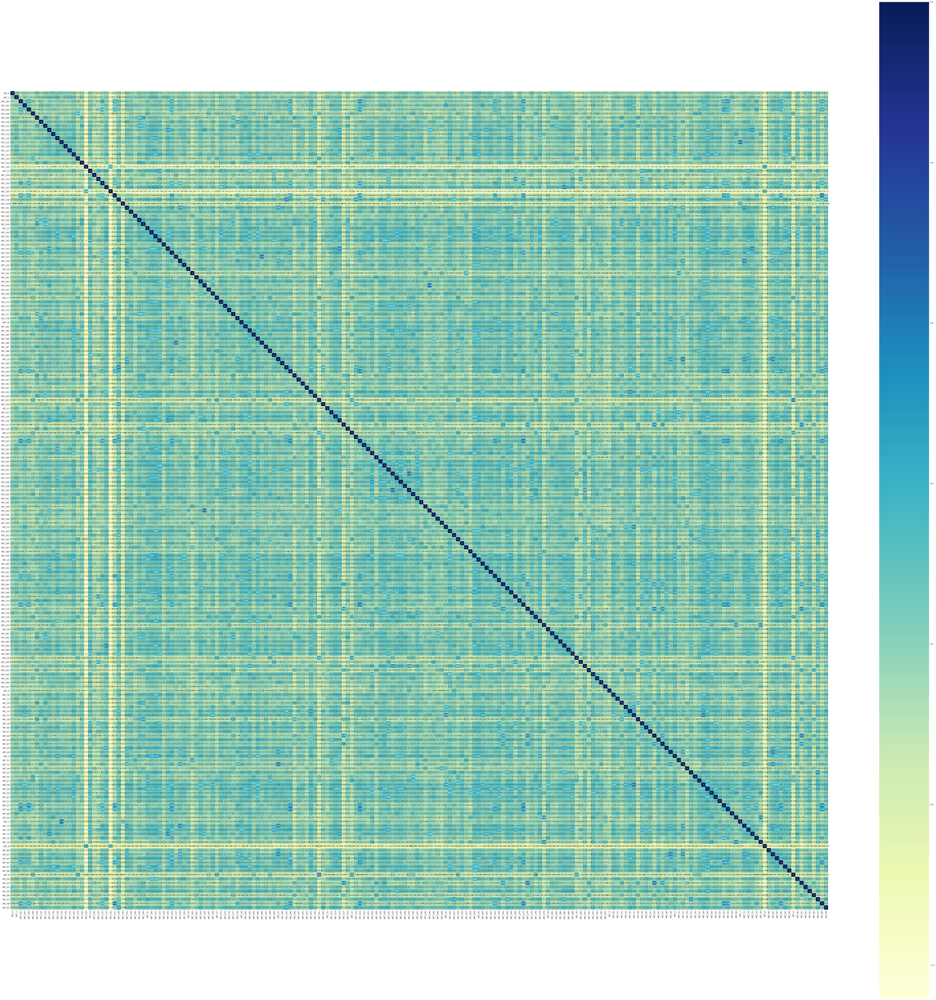

In [43]:
plt.figure(figsize=(100, 100))
sns.heatmap(returns.corr(),cmap='YlGnBu',annot=True, square=True)

In [44]:
from sklearn.covariance import oas
features = returns.columns
cov = pd.DataFrame(oas(returns.fillna(0))[0], index=features, columns=features)
beta = cov / np.diag(cov)
beta.head()

,RET_0,RET_1,RET_102,RET_105,RET_106,RET_108,RET_109,RET_110,RET_114,RET_115,...,RET_88,RET_9,RET_90,RET_91,RET_93,RET_95,RET_96,RET_97,RET_98,RET_99
RET_0,1.000000,0.126513,0.108238,0.128353,0.117609,0.070110,0.194425,0.080396,0.174791,0.118757,...,0.146664,-0.012388,0.155055,0.081016,0.181609,0.172702,0.063350,0.138673,0.104377,0.165404
RET_1,0.184228,1.000000,0.122461,0.214639,0.131930,0.117362,0.196036,0.174030,0.256237,0.223324,...,0.242727,-0.067669,0.228235,0.132136,0.177939,0.253013,0.105388,0.160021,0.109545,0.206384
RET_102,0.086988,0.067585,1.000000,0.149505,0.381845,0.146912,0.064788,0.142368,0.090649,0.104195,...,0.101701,0.008833,0.111743,0.043866,0.090732,0.162930,0.033348,0.124352,0.450246,0.230993
RET_105,0.141652,0.162670,0.205304,1.000000,0.195409,0.126792,0.134372,0.238152,0.197308,0.179270,...,0.165933,-0.003716,0.200567,0.221046,0.223728,0.219295,0.154519,0.205005,0.245215,0.320027
RET_106,0.093577,0.072087,0.378043,0.140882,1.000000,0.099451,0.076619,0.123011,0.100518,0.105586,...,0.096279,-0.018555,0.104224,0.020172,0.121545,0.133660,0.011020,0.144167,0.393937,0.196698


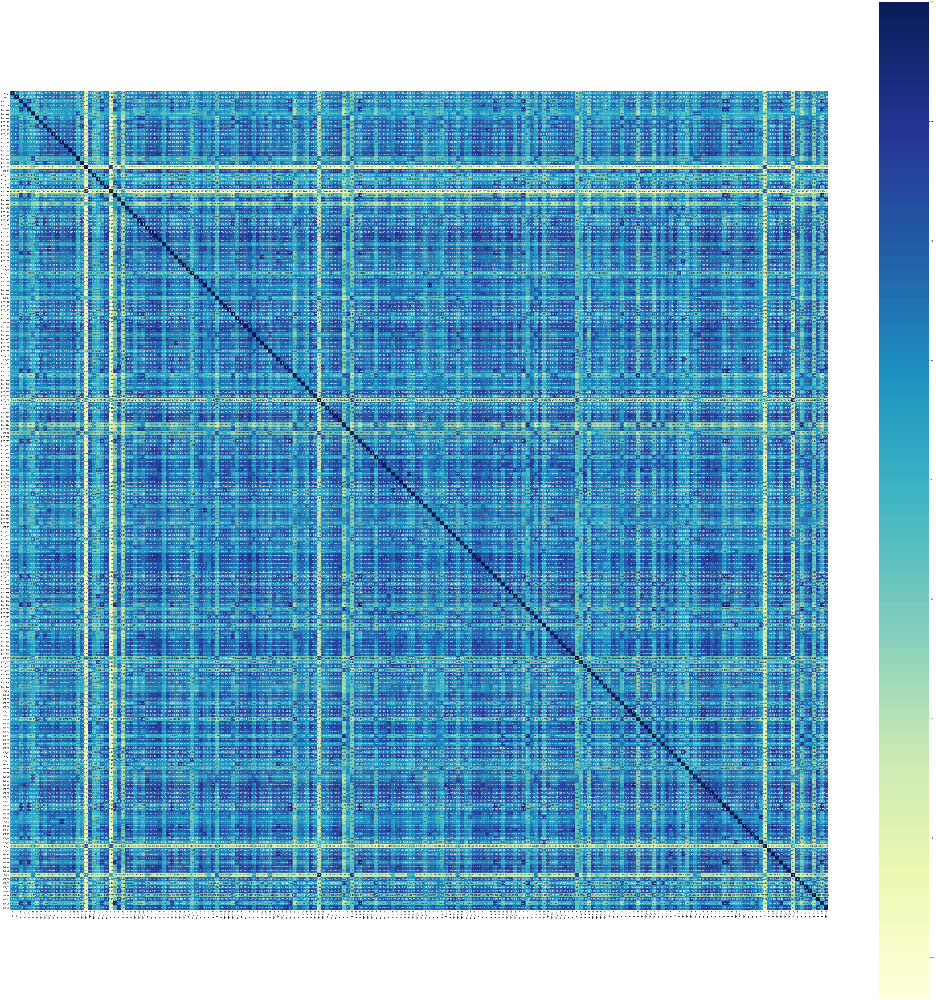

In [45]:
plt.figure(figsize=(100, 100))
sns.heatmap(beta.corr(),cmap='YlGnBu',annot=True, square=True)

In [6]:
from sklearn.model_selection import train_test_split
train_features, test_features, train_labels, test_labels = train_test_split(X_train, Y_train, test_size = 0.25, random_state = 42)

In [7]:
def weighted_accuracy(y_test, y_pred):
    y_abs = np.abs(y_test)
    norm = y_abs.sum()
    score = 0
    for i in range(len(y_test)):
        score += ((np.sign(y_pred[i]) == np.sign(y_test[i])) * np.abs(y_test[i])) / norm
    return score

# Random forest

In [8]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators = 10, random_state = 42)

model = rf.fit(train_features, train_labels.values.ravel())

In [9]:
predictions = rf.predict(test_features)
print(predictions)

[-0.00551653  0.00553872 -0.00025211 ... -0.0276247  -0.00127575
 -0.0116216 ]


In [10]:
score_train_rf = weighted_accuracy(test_labels.to_numpy(), predictions)

In [11]:
# Predictions on test data
predictions = rf.predict(X_test)

In [12]:
print(score_train_rf[0])

0.6377944372608985


Score with n_estimators = 40:  
0.650226712754603

# Catboost

In [13]:
from catboost import CatBoostRegressor

model = CatBoostRegressor(iterations=10, learning_rate=0.3, depth=15)

model.fit(train_features, train_labels.values.ravel())

predictions = model.predict(test_features)

score_train_cb = weighted_accuracy(test_labels.to_numpy(), predictions)

0:	learn: 0.0212939	total: 10.4s	remaining: 1m 33s
1:	learn: 0.0208415	total: 18.9s	remaining: 1m 15s
2:	learn: 0.0205723	total: 27.1s	remaining: 1m 3s
3:	learn: 0.0203983	total: 35.3s	remaining: 53s
4:	learn: 0.0202732	total: 43.4s	remaining: 43.4s
5:	learn: 0.0201810	total: 51.5s	remaining: 34.3s
6:	learn: 0.0200857	total: 59.6s	remaining: 25.5s
7:	learn: 0.0200271	total: 1m 7s	remaining: 16.9s
8:	learn: 0.0199738	total: 1m 15s	remaining: 8.43s
9:	learn: 0.0199201	total: 1m 24s	remaining: 0us


In [14]:
print(score_train_cb[0])

0.6901866269474299


Score with: iterations=10, learning_rate=0.3, depth=15  
0.6901866269474299

# XG Boost

In [15]:
import xgboost as xgb

xg_reg = xgb.XGBRegressor(objective ='reg:squaredlogerror', colsample_bytree = 0.7, learning_rate = 0.4, max_depth = 30, alpha = 3, n_estimators = 80)

In [16]:
xg_reg.fit(train_features, train_labels.values.ravel())

predictions = xg_reg.predict(test_features)

score_train_xgb = weighted_accuracy(test_labels.to_numpy(), predictions)

Objective candidate: survival:aft  
Objective candidate: binary:hinge  
Objective candidate: multi:softmax  
Objective candidate: multi:softprob  
Objective candidate: rank:pairwise  
Objective candidate: rank:ndcg  
Objective candidate: rank:map  
Objective candidate: count:poisson  
Objective candidate: survival:cox  
Objective candidate: reg:gamma  
Objective candidate: reg:tweedie  
Objective candidate: reg:squarederror  
Objective candidate: reg:squaredlogerror  
Objective candidate: reg:logistic  
Objective candidate: reg:pseudohubererror  
Objective candidate: binary:logistic  
Objective candidate: binary:logitraw  
Objective candidate: reg:linear  

In [17]:
print(score_train_xgb[0])

0.6989711485386654


Score with: objective ='reg:squaredlogerror', colsample_bytree = 0.5, learning_rate = 0.5, max_depth = 30, alpha = 5, n_estimators = 100    

0.6973100989498846

# Saving the results

In this last part, we save the results of the prediction using the Xg_reg model

In [39]:
predictions_test_data = xg_reg.predict(X_test)

In [40]:
def tobinary(nb):
    if(nb>0):
        return 1
    else:
        return -1

In [43]:
for i in range(len(predictions_test_data)):
    predictions_test_data[i] = int(tobinary(predictions_test_data[i]))

In [56]:
res_df = pd.DataFrame(columns=['ID','RET_TARGET'])
for i in range(len(X_test)):
    res_df.loc[i] = [X_test.iloc[i]['ID']] + [predictions_test_data[i]] 

In [68]:
resy= 0
for i in range(len(res_df)):
    resy += res_df.iloc[i]['RET_TARGET']
print(resy)

77652


In [67]:
res_df.name = "RET_TARGET"
res_df = res_df.astype(int)
res_df.to_csv('./submission.csv', index=False)

In [45]:
print(predictions_test_data)
print(len(predictions_test_data))

[ 1.  1.  1. ... -1. -1. -1.]
114468
